##Object Detection using SSD Mobilenet and Tensorflow Object Detection API : Detection of any single class from coco dataset.


In [1]:
#Install tensorflow version 2 or higher
'''
 Object localization and identification are two different tasks that are put together to achieve this singular goal of object detection.
'''
!pip install -U --pre tensorflow=="2.*"

     |████████████████████████████████| 458.3 MB 3.3 kB/s 
     |████████████████████████████████| 1.3 MB 37.1 MB/s 
     |████████████████████████████████| 4.3 MB 43.3 MB/s 
     |████████████████████████████████| 462 kB 45.0 MB/s 
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30693 sha256=4324b17f2f920be5a06971e0393f7624c73dfda47c822432600a938fc309c231
  Stored in directory: /root/.cache/pip/wheels/98/91/04/971b4c587cf47ae952b108949b46926f426c02832d120a082a
Successfully built clang
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.34.1
    Uninstalling grpcio-1.34.1:
      Successfully uninstalled grpcio-1.34.1
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.5.0
    Uninstalling tensorflow-estimator-2.5.0:
      Successfully uninstalled tensorflow-estimator-2.5.0
  Attempting uninstall: keras
    Found existing installation: Keras 2.4.3
    Uninstalling Keras-2.4.3:
      Successfully un

In [2]:
#install pycocotools for coco detection API.
#COCO API - http://cocodataset.org/ COCO is a large image dataset designed for object detection, segmentation, person keypoints detection, stuff segmentation, and caption generation. This package provides Matlab, Python, and Lua APIs that assists in loading, parsing, and visualizing the annotations in COCO.
!pip install pycocotools

In [3]:
#get tensorflow/models by cloning the repository
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2824, done.
remote: Counting objects: 100% (2824/2824), done.
remote: Compressing objects: 100% (2350/2350), done.
remote: Total 2824 (delta 725), reused 1378 (delta 439), pack-reused 0
Receiving objects: 100% (2824/2824), 32.82 MiB | 23.13 MiB/s, done.
Resolving deltas: 100% (725/725), done.


In [4]:
cd models/research

/content/models/research


In [6]:
#compile protobufs
!protoc object_detection/protos/*.proto --python_out=.

In [9]:
#install object_detection python package
!pip install object_detection

ERROR: Could not find a version that satisfies the requirement object_detection (from versions: none)
ERROR: No matching distribution found for object_detection


In [10]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [11]:
#install tf_slim python package:
!pip install tf_slim

     |████████████████████████████████| 352 kB 10.9 MB/s 


In [12]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [13]:
#function to load your model
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [14]:
# load your label map.
'''
 Label maps map indices to category names/Class names. 
 For example when our neural network predicts 1, it will correspond to “person” class or if it will predict,
  suppose 18, it will correspond to “dog” category.
 '''
PATH_TO_LABELS = 'object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [15]:
#Test image will help you to check your model detections over the given class.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('object_detection/test_images/image1.jpg'),
 PosixPath('object_detection/test_images/image2.jpg'),
 PosixPath('object_detection/test_images/image3.jpg')]

In [16]:
#load your object detection SSD mobilenet v1 model for object detection
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

76546048/76534733 [==============================] - 3s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [17]:
print(detection_model.inputs)
detection_model.output_dtypes

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [31]:
#Now add this wrapper function which is calling the model and returns the output.

def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  input_tensor = tf.convert_to_tensor(image)
  input_tensor = input_tensor[tf.newaxis,...]
  output_dict = model(input_tensor)
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  if 'detection_masks' in output_dict:
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [32]:
'''
Now, this is the main step where you can just pass on the class id
corresponding to the category you want to detect in the class_id parameter of the function given below.
(provided it should be present in the coco dataset).
'''

def show_inference(model, image_path,class_id):
  image_np = np.array(Image.open(image_path))
  output_dict = run_inference_for_single_image(model, image_np)
  boxes = []
  classes = []
  scores = []
  for i,x in enumerate(output_dict['detection_classes']):
    if x==class_id and output_dict['detection_scores'][i] > 0.5:
      classes.append(x)
      boxes.append(output_dict['detection_boxes'][i])
      scores.append(output_dict['detection_scores'][i])
  boxes = np.array(boxes)
  classes = np.array(classes)
  scores = np.array(scores)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      boxes,
      classes,
      scores,
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=2)
  
  display(Image.fromarray(image_np))

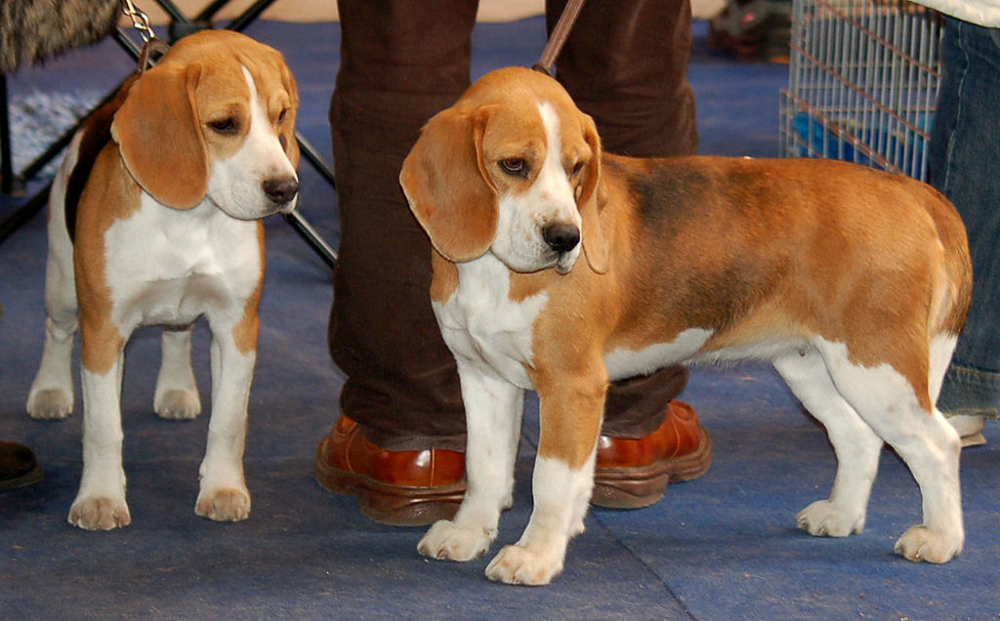

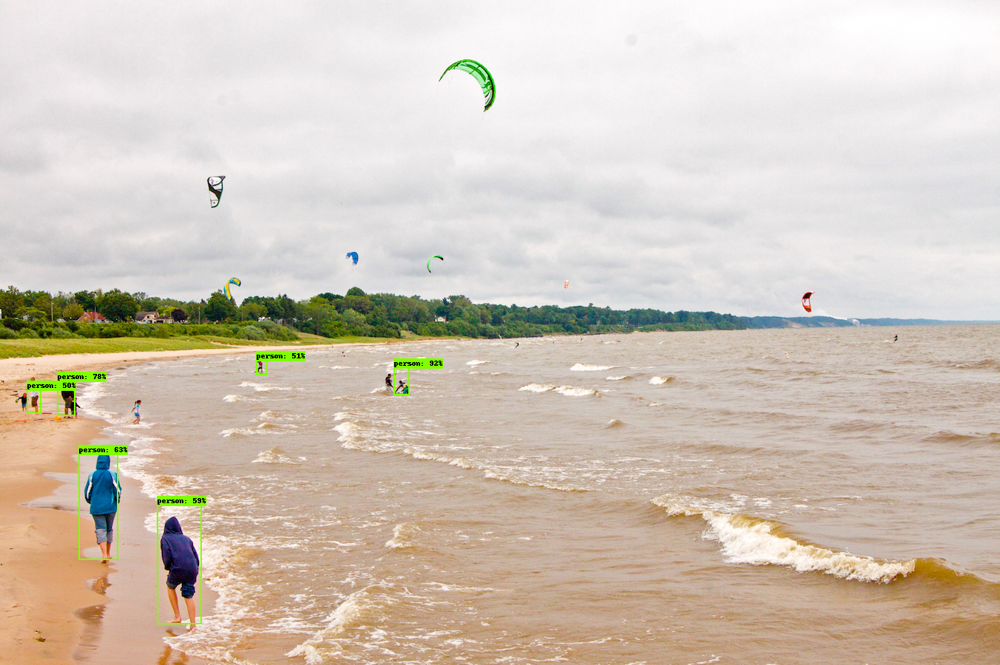

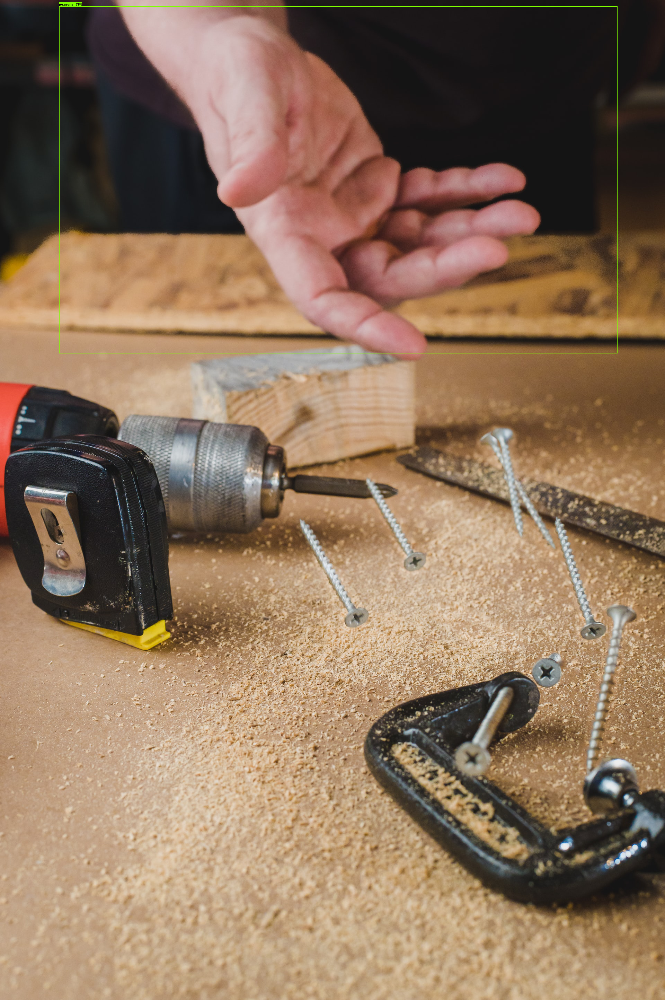

In [33]:
#this is the final step to see your output on the test images.
'''
Let’s suppose we have two images in the test_images directory and I’ve passed class_id to be 1 which corresponds to “person” 
so in both the images only persons are detected.
'''
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path, 1)